***

***

# Práctica 3 de Sistemas Multimedia: Introducción al procesamiento de audio

Práctica desarrollada por Andres J. Sanchez-Fernandez (sfandres@unex.es) y Juan M. Haut (juanmariohaut@unex.es) para la asignatura Sistemas Multimedia de la Universidad de Extremadura.

Fecha de última modificación: 15/01/2023.

## Objetivos

Los objetivos de esta práctica son los siguientes:
<ol>
    <li>Entender lo que es una <b>onda de sonido</b> y cómo se realiza el <b>proceso de adquisición</b> de la misma.</li>
    <li>Saber diferenciar entre sonido <b>estéreo</b> y <b>mono</b>.</li>
    <li>Comprender la importancia de los conceptos básicos que caracterizan una onda: la <b>frecuencia de muestreo</b> (<em>sample rate</em>), la <b>profundidad de bits</b> (<em>bit depth</em>), el <b>ancho de banda</b> (<em>bandwidth</em>) y la <b>tasa de bits</b> (<em>bitrate</em>).</li>
    <li>Conocer la teoría de muestreo de Nyquist y el problema de <em>Aliasing</em>.</li>
    <li>Aprender a utilizar las <b>librerías más importantes de Python</b> para el manejo de audios.</li>
    <li>Conocer la diferencia entre gráfica de onda en el <b>dominio del tiempo</b> vs <b>de la frecuencia</b> (Transformada de Fourier).</li>
    <li>Aprender el <b>concepto de energía del espectrograma</b> y realizar la <b>compresión de audio</b> en base al mismo.</li>
</ol>

## Crear venv de Python (mejor en terminal)

In [1]:
# NECESARIO:

# Crear el entorno de desarrollo.
# !python3 -m venv venv_name

# Activar el entorno de desarrollo.
# !source ./venv_name/bin/activate

# Instalar nuevo kernel de jupyter.
# !python3 -m ipykernel install --user --name=venv_name

# Comprobar que se ha instalado correctamente.
# !jupyter kernelspec list

# Comprobar que no hay tantos paquetes.
# !pip3 list

In [2]:
# OPCIONAL:

# Eliminar un kernel de jupyter.
# !jupyter kernelspec remove venv_name -y

# Comprobar que se ha eliminado correctamente.
# !jupyter kernelspec list

# Eliminar la carpeta del entorno virtual.
# !rm -rf venv_name/

## Importar librerías y módulos de Python

En este apartado vamos a trabajar con las siguientes librerías:
<ul>
  <li><a href="https://docs.scipy.org/doc/scipy/reference/io.html">Scipy.io</a> para leer el archivo de audio.</li> 
  <li><a href="https://ipython.org/ipython-doc/3/api/generated/IPython.display.html">IPython</a> para graficar el audio.</li> 
</ul>

Nota: Estas no son las únicas librerías de Python con las que se pueden trabajar para el procesamiento de archivos de audio (otro ejemplo podría ser <a href="https://librosa.org/doc/latest/index.html">Librosa</a>). Si alguien está familiarizado con otras librerías puede utilizarlas.

Importamos las librerías/módulos específicos de la siguiente forma.

In [3]:
# Importacion.
from scipy.io import wavfile
import IPython
import os
import numpy as np
import matplotlib.pyplot as plt

# Directorios que usaremos.
audio_input_path = os.path.join('audio', '_input')
audio_output_path = os.path.join('audio', '_output')

## Bibliografía consultada

Información consultada para el desarrollo de esta práctica:
<ul>
    <li><em>RouteNote Blog: Understanding sample rates in digital audio by Connor Edney</em> <a href="https://routenote.com/blog/what-is-sample-rate-in-audio/">[Link]</a></li>
    <li><em>MiniTool: What Is Audio Sample Rate & How to Change Sample Rate of Audio by Cora</em> <a href="https://videoconvert.minitool.com/video-converter/audio-sample-rate.html">[Link]</a></li>
    <li>Repositorios de Github:
        <ul>
            <li>Cómo graficar espectrogramas de Audios en Python <a href="https://www.kaggle.com/code/joeportilla/c-mo-graficar-espectrogramas-de-audios-en-python/notebook">[Link]</a></li>
            <li><em>Simple audio compression with Python</em> <a href="https://github.com/jmpion/simple-audio-compression-with-python/blob/master/simple-audio-compression.ipynb">[Link]</a></li>
        </ul>
    </li>
</ul>

## Codigo para reducir un archivo de audio truncando (ignorar)

***

***

# Primer paso: Cargar el archivo de audio (sonido estéreo vs mono)

Cargamos el archivo de audio.

In [4]:
# Cargamos el archivo de audio.
filename = os.path.join(audio_input_path, 'sample1_stereo.wav')
sample_rate, audio_data = wavfile.read(filename)
print(f'Audio sample rate: {sample_rate/1000} kHz')

Audio sample rate: 44.1 kHz


Vamos a mostrar la información. Nota: es audio estereo (dos canales).

In [5]:
# Mostrar informacion (sonido stereo).
print('Datos de audio (estereo):')
print(f'- Tamaño:     {audio_data.shape}')
print(f'- 1º canal:   {audio_data[:5, 0]}...')
print(f'- 2º canal:   {audio_data[:5, 1]}...')
print(f'- Resolucion: {type(audio_data[0,0])}\n')

Datos de audio (estereo):
- Tamaño:     (5384326, 2)
- 1º canal:   [137 140  91   4 -69]...
- 2º canal:   [ 66  38   0 -10  45]...
- Resolucion: <class 'numpy.int16'>



Ahora, por simplificación, vamos a calcular la media por canal para obtener un sonido mono.

In [6]:
# Convertimos a mono mediante la media por canal (simplificacion).
new_data_mono = audio_data.mean(axis=1)  #.astype(float)
print('Nuevos datos de audio (mono):')
print(f'- Nuevo tamaño: {new_data_mono.shape}')
print(f'- Canal unico:  {new_data_mono[:5]}...')

# Mantenemos la misma resolucion que antes.
new_data_mono = new_data_mono.astype(np.int16)
print(f'- Resolucion:   {type(new_data_mono[0])}\n')

Nuevos datos de audio (mono):
- Nuevo tamaño: (5384326,)
- Canal unico:  [101.5  89.   45.5  -3.  -12. ]...
- Resolucion:   <class 'numpy.int16'>



Vamos a guardarlo.

In [7]:
# Guardamos el archivo mono a un fichero de tipo wav.
wavfile.write(
    filename=os.path.join(audio_output_path, 'sample1_mono.wav'),
    rate=sample_rate,
    data=new_data_mono
)

Vamos a escucharlo. Para que esto se haga correctamente, hay que indicarle la frecuencia de muestreo (veremos más adelante qué es).

In [8]:
IPython.display.Audio(new_data_mono, rate=sample_rate)

Tenemos los siguientes tamaños de archivo.

In [9]:
!ls -sh audio/_input/sample1_stereo.wav
!ls -sh audio/_output/sample1_mono.wav

21M audio/_input/sample1_stereo.wav
11M audio/_output/sample1_mono.wav


Como podemos ver el tamaño se ha reducido a la mitad (manteniendo el la frecuencia de muestreo). Mostramos por pantalla la frecuencia de muestreo (*sample rate*) del archivo de audio: 

In [10]:
print(f'Frecuencia de muestreo (sample rate): {sample_rate/1000} kHz\n')

Frecuencia de muestreo (sample rate): 44.1 kHz



Muy bien pero: *¿cómo se adquiere esta onda de audio?*, *¿qué significa esta frecuencia de muestreo?* Todo esto y más lo veremos a continuación.

***

***

# Teoría: Toma de muestras de audio

## Definición de muestra

Una muestra es una medición instantánea de una onda sonora: una medida de la amplitud de la onda (intensidad de la señal).

Un sistema digital, como una interfaz de audio, toma miles de muestras individuales que registran la amplitud de la onda sonora para reconstruirla digitalmente.

<figure>
    <img src="img/wavecycle.jpg"
         alt="missing"
         width=350>
    <figcaption><em><b>Figura</b>: Ejemplo de una onda sonora simplificada.</em></figcaption>
</figure>

Las ondas sonoras son ondas continuas y están formadas por ciclos de onda individuales. Por tanto, una muestra es una medición de la amplitud de un ciclo de onda individual.

Entonces nuestra interfaz puede convertir la onda sonora en datos binarios, interpretables por nuestro ordenador. Ahora bien, ¿cada cuánto tomamos una muestra?

## Frecuencia de muestreo (sample rate)

La frecuencia de muestreo es una medida del número de muestras que tomamos por segundo de audio y, por tanto, de la velocidad a la que lo hacemos.

En la práctica, necesitamos tomar miles de muestras de nuestra grabación por segundo si queremos que nuestra señal digital suene fiel a nuestra onda sonora original.

<figure>
    <img src="img/sample_rate.jpg"
         alt="missing"
         width=500>
    <figcaption><em><b>Figura</b>: Explicación visual de la frecuencia de muestreo de una onda de audio. En el primer ejemplo, el resultado digital es deficiente
        porque las muestras no son lo bastante frecuentes. En el segundo, el resultado es mucho mejor y más suave. Ahora bien, es en el tercer ejemplo donde el 
        resultado digital es tan suave como el audio original al tomarse suficientes muestras.</em>
    </figcaption>
</figure>

A mayor frecuencia de muestreo capturamos mayor cantidad de detalles de la onda original.

Por otro lado, la unidad de la frecuencia de muestreo es el Hercio (Hz) que equivale a un periodo de muestreo T = 1s. Aunque normalmente se utiliza la unidad derivada kHz (1 kHz = 1 000 Hz).

Una de las frecuencias de muestreo de audio más común actualmente es de 44,1 kHz, esto significa que se toman 44 100 muestras de audio por segundo. Recapitulando, las más habituales son:
<ul>
    <li>44,1 kHz (44 100 muestras/s) es la frecuencia de muestreo de audio estándar para el audio de CD, y también se utiliza para el audio MPEG-1. Además, hay otras frecuencias de muestreo que se utilizan para otros casos.</li>
    <li>8 kHz es la frecuencia de muestreo de audio utilizada por los teléfonos, ya que es suficiente para el habla humana.</li>
    <li>32 kHz es ampliamente utilizada por las videocámaras digitales MiniDV, DAT, cintas de vídeo, etc.</li>
    <li>48 kHz es la frecuencia de muestreo que suelen utilizar los equipos de vídeo digital, DVD, TV digital, películas y la mayoría de los equipos de audio profesionales.</li>
    <li>50 kHz es la frecuencia de muestreo utilizada principalmente por los grabadores digitales comerciales.</li>
    <li>88,2 kHz es la frecuencia de muestreo utilizada por algunos equipos de grabación profesionales cuando se apunta a un CD para realizar grabaciones de alta resolución.</li>
    <li>96 kHz es el doble del estándar de 48 kHz y se utiliza principalmente en DVD-Audio, pistas de audio de Blu-ray Disc, pistas de audio de DVD de alta definición, etc. Y también está disponible en algunos equipos profesionales de grabación y producción de audio.</li>
    <li>192 kHz empleada principalmente en Hi-Res audio junto con la de 96.
</ul>


## Pregunta sencilla: a mayor frecuencia de muestreo, ¿mayor calidad?

La solución es también sencilla: ¡Sí!

Al aumentar el número de muestras que se toman por segundo, tenemos una mayor resolución, y con ello una mayor calidad del audio. Sin embargo, no todo es bueno: Al grabar con una frecuencia de muestreo más alta se crea un archivo de audio también mayor. Como se toman más muestras, se necesita más espacio en disco para almacenarlas y un procesador con mayor potencia para su procesamiento.

Ya no es solo el mayor espacio ocupado en disco, sino que un archivo de audio grande es contraproducente para transmitirlo por internet, por ejemplo, en plataforma de streaming tales como Spotify, Amazon Music, etc.

## ¿A qué valor se fija la frecuencia de muestreo?

Posible respuesta: <b>Teorema de muestreo de Nyquist-Shannon</b>.

La teoría de Nyquist establece que necesitamos una frecuencia de muestreo igual al doble de la frecuencia más alta de una señal para capturar todas las frecuencias de la misma. Esto se debe a que un ciclo de onda singular siempre tiene un valor de amplitud negativo y otro positivo. Estos valores son la medida de la intensidad de la señal de los ciclos (amplitud). Y para hallar la longitud de onda de cada ciclo de onda---que determina sus frecuencias---se deben muestrear las amplitudes positiva y negativa de cada ciclo.

En consecuencia, debemos muestrear cada onda dos veces si queremos que nuestra señal digital tenga la frecuencia correcta.

## Cuando el muestreo sale mal: *Aliasing*

La teoría de muestreo de Nyquist nos dice que tomar menos de 2 muestras por ciclo conduce a una reconstrucción digital incorrecta de nuestra señal: un "alias" no deseado del original. Por tanto, se denomina aliasing, o solapamiento, al efecto que causa que señales continuas distintas sean indistinguibles cuando se muestrean digitalmente a causa de una frecuencia de muestreo demasiado baja. Cuando esto sucede, la señal original no puede ser reconstruida de forma unívoca a partir de la señal digital.

Lo vamos a ilustrar con el siguiente ejemplo.

Vamos a muestrear la siguiente señal siguiendo el criterio de Nyquist:

<figure>
    <img src="img/nyquist_sample_rate_perfect.jpg"
         alt="missing"
         width=400>
    <figcaption><em><b>Figura</b>: Onda sonora muestreada con una frecuencia de muestro que cumple con el teorema de Nyquist.</em>
    </figcaption>
</figure>

Podemos observar como la señal reconstruida (3) es similar a la original (1) ya que hemos tomado suficientes muestras (2). Ahora bien, si aumentamos la frecuencia de la señal original sin aumentar el número de muestras ocurre lo siguiente:

<figure>
    <img src="img/too_low_a_sample_rate_poor.jpg"
         alt="missing"
         width=400>
    <figcaption><em><b>Figura</b>: Onda sonora muestreada con una frecuencia de muestro menor que la necesaria según el teorema de Nyquist.</em>
    </figcaption>
</figure>

Ahora podemos ver que, a pesar de que la nueva señal (4) es muy diferente a la que vimos anteriormente (1), el resultado de la señal reconstruida (6) es el mismo que en el caso anterior (3).

<b>Entonces concluímos que se ha producido aliasing.</b>

***

***

# Teoría: Características de grabación de audio digital

Una vez que hemos capturado la onda como se ha explicado, hay que almacenar la información en forma de bits.

<figure>
    <img src="img/adc.jpg"
         alt="missing"
         width=500>
    <figcaption><em><b>Figura</b>: Conversión Analógica Digital (ADC).</em>
    </figcaption
</figure>

## Ancho de banda (*bandwidth*)

La profundidad de bits determina cuántos bits disponibles hay para medir la onda sonora en primer lugar, y luego para que almacenemos nuestras muestras en bytes digitales. Por lo tanto, una profundidad de bits que pueda acomodar las miles de muestras por segundo nos permite grabar con la mayor resolución posible.

En otras palabras, <b>la profundidad de bits y la frecuencia de muestreo trabajan juntas para darnos el ancho de banda total de nuestra grabación digital</b>.

\begin{equation}
Profundidad\;de\;bits\;(bit\;depth)+frecuencia\;de\;muestreo\;(sample\;rate)=ancho\;de\;banda\;(bandwidth)
\end{equation}

Esto significa que el ancho de banda total que podemos utilizar define la precisión de nuestra señal digital con respecto a la grabación original.

<b>Más ancho de banda implica una reproducción más exacta.</b>

<figure>
    <img src="img/bit_depth.jpg"
         alt="missing"
         width=600>
    <figcaption><em><b>Figura</b>: La frecuencia de muestreo y la profundidad de bits forman el ancho de banda de audio total. La cantidad de bits disponibles se corresponde con el número de valores de amplitud digital a los que podemos asignar nuestras muestras.</em>
    </figcaption
</figure>

## Frecuencia de muestreo vs tasa de bits (*bitrate*)

Como se ha explicado, la frecuencia de muestreo representa cuántas muestras de la onda sonora original tomamos por segundo. Aunque tenemos otra variable también: el flujo o tasa de bits, que determina el tamaño del archivo de audio digital. La tasa de bits es un cálculo matemático del tamaño de los archivos digitales en megabytes por segundo (Mbps)---no confundir con la profundidad de bits.

Para calcular la tasa de bits de tu grabación digital, puedes utilizar el siguiente cálculo:

\begin{equation}
bitrate\,(Mbps) = f_s \cdot f_d \cdot n_c
\end{equation}

donde $f_s$ es la frecuencia de muestreo, $f_d$ es la profundidad de bits y $n_c$ es el número de canales de la grabación.

En base a todo esto, se puede decir que la tasa de bits determina el número de bits que el ordenador debe procesar por segundo para reproducir la grabación de audio digital de la forma prevista.

<p style="border-width:1.5px; border-style:solid; border-color:#0000FF; background-color:#EEEEEE; padding:1em;">
    <b>Ejemplo</b>: Supongamos que grabamos un riff de guitarra con una frecuencia de muestreo de 44,1 kHz y una profundidad de bits de 24 bits. Entonces tendríamos una tasa de bits de:<br><br>
    $44\,100\,(Hz)\cdot 24\,(bits) \cdot 1\,canal = 1\,058\,400\,(bps) = 1,1\,(Mbps)$<br><br>
    Y después de calcular la tasa de bits de tu grabación, multiplícala por el número de segundos de tu grabación. Digamos que grabamos durante 20 segundos, nos quedaría:<br><br>
    $1,1\,(Mbps) \cdot 20\,(s) = 22\,Mb$
</p>





***

***

# Práctica: Compresión de audio

## Cargar audios

Vamos a cargar otros dos archivos de audio adquiridos a distintas frecuencias de muestreo: 48 y 24 kHz.

In [11]:
# Cargamos los archivos de audio.
sample_rate_48, audio_data_48 = wavfile.read(filename=os.path.join(audio_input_path, 'sample_48kHz.wav'))
sample_rate_24, audio_data_24 = wavfile.read(filename=os.path.join(audio_input_path, 'sample_24kHz.wav'))

# Otro ejemplo sería: audio_data, sample_rate = librosa.load(filename)

print(f'{audio_data_48.shape}\n')  # Audio mono

(176542,)



Vamos a escuchar el audio adquirido a 48 kHz por ejemplo.

In [12]:
IPython.display.Audio(audio_data_48, rate=sample_rate_48)

Tenemos los siguientes tamaños de archivo.

In [13]:
!ls -sh audio/_input/sample_48kHz.wav
!ls -sh audio/_input/sample_24kHz.wav

348K audio/_input/sample_48kHz.wav
176K audio/_input/sample_24kHz.wav


Como se puede ver y es lógico, la frecuencia de muestreo también afecta al tamaño del archivo de audio

## Gráficas características

### Dominio del tiempo

In [14]:
ampl_values_48 = len(audio_data_48)
print(f'Número de muestras del archivo (valores de amplitud): {ampl_values_48}')

Número de muestras del archivo (valores de amplitud): 176542


In [15]:
ampl_values_24 = len(audio_data_24)
print(f'Número de muestras del archivo (valores de amplitud): {ampl_values_24}')

Número de muestras del archivo (valores de amplitud): 88271


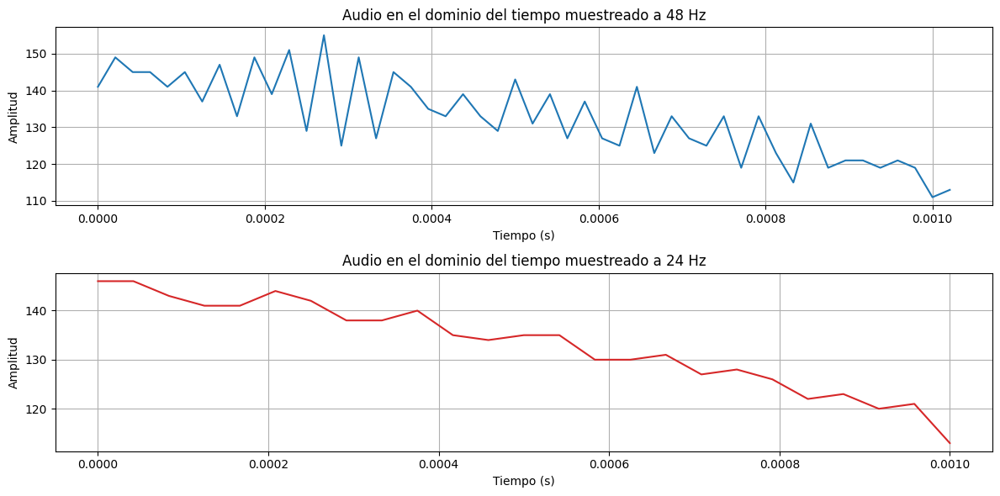

In [16]:
t1 = np.arange(0, ampl_values_48/sample_rate_48, 1/sample_rate_48)
t2 = np.arange(0, ampl_values_24/sample_rate_24, 1/sample_rate_24)

fig, ax = plt.subplots(2, 1, figsize=(12, 6))
fig.patch.set_facecolor('white')
end = 50

ax[0].plot(t1[:end], audio_data_48[:end])
ax[0].set_title('Audio en el dominio del tiempo muestreado a 48 Hz')
ax[0].set_xlabel('Tiempo (s)')
ax[0].set_ylabel('Amplitud')
ax[0].grid(True)

ax[1].plot(t2[:int(end/2)], audio_data_24[:int(end/2)], c='tab:red')
ax[1].set_title('Audio en el dominio del tiempo muestreado a 24 Hz')
ax[1].set_xlabel('Tiempo (s)')
ax[1].set_ylabel('Amplitud')
ax[1].grid(True)

plt.tight_layout()
plt.show()

Podemos ver que la primera onda tiene mayor precisión que la segunda, ya que tiene el doble de frecuencia de muestreo.

### Dominio de la frecuencia: Transformada de Fourier (FFT) 

#### Teoría

Vamos a descomponer la señal en vez de en el dominio del tiempo (eje x igual a tiempo en segundos) en el dominio de la frecuencia (eje x igual a frecuencia en Hz). A continuación se presentan dos ejemplos animados del funcionamiento de la Transformada de Fourier:

<figure>
    <img src="img/Fourier_1.gif"
         alt="missing"
         width=350>
    <figcaption><em><b>Figura animada</b>: Ejemplo 1 de la transformada de Fourier (créditos Wikipedia).</em>
    </figcaption
</figure>

<figure>
    <img src="img/Fourier_2.gif"
         alt="missing"
         width=450>
    <figcaption><em><b>Figura animada</b>: Ejemplo 2 de la transformada de Fourier (créditos Toptal).</em>
    </figcaption
</figure>

#### Análisis de Fourier

La "Transformación rápida de Fourier", FFT para abreviar, es un importante método de medición en la tecnología de medición de audio y acústica. Descompone una señal en sus componentes 
espectrales individuales y así proporciona información sobre su composición.

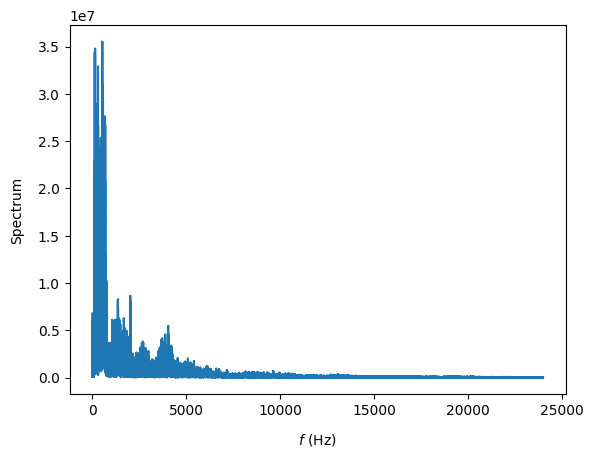

In [17]:
# La longitud del array de datos y el
# sample rate (frecuencia de muestreo).
n = len(audio_data_48) 
Fs = sample_rate_48

# Working with stereo audio, there are two channels in the audio data.
# Let's retrieve each channel seperately:
# ch1 = np.array([data[i][0] for i in range(n)]) #channel 1
# ch2 = np.array([data[i][1] for i in range(n)]) #channel 2

# Calculando la Transformada Rapida de Fourier (FFT).
ch_Fourier = np.fft.fft(audio_data_48)

# Solo miramos frecuencia por debajo de Fs/2
# (Nyquist-Shannon) --> Spectrum.
abs_ch_Fourier = np.absolute(ch_Fourier[:n//2])

# Graficamos.
plt.plot(np.linspace(0, Fs/2, n//2), abs_ch_Fourier)
plt.ylabel('Spectrum', labelpad=10)
plt.xlabel('$f$ (Hz)', labelpad=10)
plt.show()

## Energia del espectrograma y frecuencia de corte

Ahora vamos a definir una frecuencia umbral $f_0$ por la que cortar el espectro, es decir, solo nos quedaremos con aquellas frecuencias por debajo de este valor en el archivo de audio comprimido. Para ello definimos el parámetro $\epsilon \in (0, 1)$ que representa la parte de la energía del espectro que no conservamos (la integral con respecto a la frecuencia).

En esta práctica, a modo de ejemplo, seleccionamos un $\epsilon=10^{-5}$ para quitar únicamente una parte, podéis jugar con este valor como queráis para ver el resultado. De manera intuitiva, a medida que aumenta su valor, se mantienen menos frecuencias por lo que la calidad del audio es peor aunque el tamaño del archivo de salida es más reducido. Por lo que tenemos que buscar un buen balance en este sentido.

Epsilon: 0.123
Valor de corte para la energia del espectro: 44435640427.12276
Mascara: [False False False ...  True  True  True]
Frecuencia de corte f0 (Hz): 5972


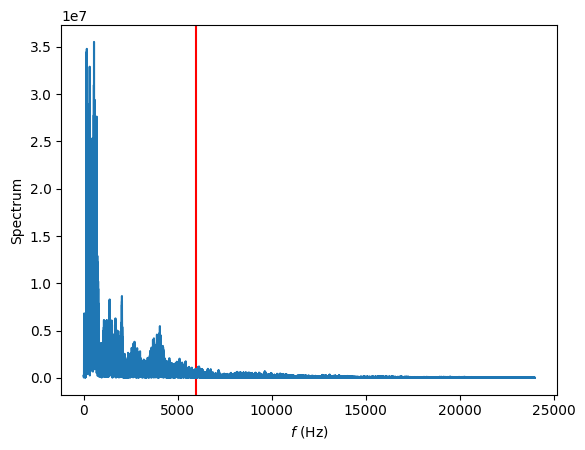

In [18]:
# Definimos epsilon: la parte de la energia
# del espectro que no conservamos.
eps = [1e-5, .02, .041, .063, .086, .101, .123]

eps = eps[6]  # Cambiar valores.
print(f'Epsilon: {eps}')

# Calculamos el valor de corte para esta energia.
thr_spec_energy = (1 - eps) * np.sum(abs_ch_Fourier)
print(f'Valor de corte para la energia del espectro: {thr_spec_energy}')

# Integral de la frecuencia --> energia del espectro.
spec_energy = np.cumsum(abs_ch_Fourier)

# Mascara (array booleano) que compara el valor
# de corte con la energia del espectro.
frequencies_to_remove = thr_spec_energy < spec_energy  
print(f'Mascara: {frequencies_to_remove}')

# La frecuencia f0 por la que cortamos el espectro.
f0 = (len(frequencies_to_remove) - np.sum(frequencies_to_remove)) * (Fs/2) / (n//2)
print(f'Frecuencia de corte f0 (Hz): {int(f0)}')

# Graficamos.
plt.axvline(f0, color='r')
plt.plot(np.linspace(0, Fs/2, n//2), abs_ch_Fourier)
plt.ylabel('Spectrum')
plt.xlabel('$f$ (Hz)')
plt.show()

## Reducción de la resolución de muestreo (*downsampling*)

### Compresión

Para reducir el tamaño del archivo de audio, lo que vamos a hacer es aplicar <em>downsampling</em>. Vamos a definir el factor de <em>downsampling</em> $D$, el cual utilizaremos para quedarnos únicamente con la secuencia de valores ($\hat{x}$) del audio original ($x$) como sigue:

\begin{equation}
\hat{x}[i] = x[D\cdot i]
\end{equation}

Esta equación quiere decir que la secuencia de audio resultante estará compuesta por aquellos elementos elementos situados en las posiciones múltiplo de $D$ (<em>slicing</em>). Para saber qué valor debemos utilizar para el <em>downsampling</em>, una opción es la de calcular $D=\frac{f_s}{f_0}$, por lo que la nueva frecuencia de muestreo (<em>sample rate</em>) estaría definida por $\hat{f}_s=\frac{f_s}{D}$.

Gracias a todo este proceso, las frecuencias que constituyen la parte principal del espectro quedarán por debajo de la nueva frecuencia de muestreo.

In [19]:
# Definimos los nombres de los audios comprimidos.
wav_compressed_file = "sample_48kHz_compressed.wav"

# Calculamos el factor D de downsampling.
D = int(Fs / f0)
print(f'Factor de downsampling: {D}')

# Obtenemos los nuevos datos (slicing with stride).
new_data = audio_data_48[::D] #, :]

# Escribimos los datos a un archivo de tipo wav.
wavfile.write(
    filename=os.path.join(audio_output_path, wav_compressed_file),
    rate=int(Fs/D),
    data=new_data
)

# Cargamos el nuevo archivo.
new_sample_rate, new_audio_data = wavfile.read(filename=os.path.join(audio_output_path, wav_compressed_file))

Factor de downsampling: 8


In [20]:
IPython.display.Audio(new_audio_data, rate=new_sample_rate)

En tamaño tenemos ahora:

In [21]:
!ls -sh audio/_output/sample_48kHz_compressed.wav

44K audio/_output/sample_48kHz_compressed.wav


### Espectrograma

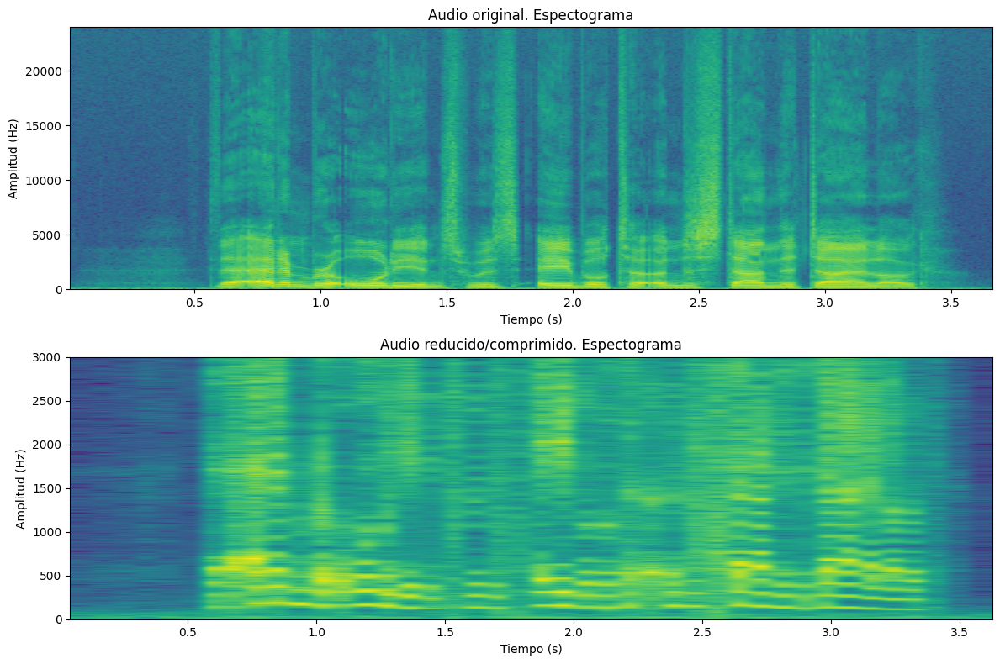

In [22]:
fig, ax = plt.subplots(2, 1, figsize=(12, 8))
fig.patch.set_facecolor('white')

Pxx, freqs, bins, im = ax[0].specgram(audio_data_48, NFFT=1024, Fs=sample_rate_48, noverlap=512)
ax[0].set_title('Audio original. Espectograma')
ax[0].set_xlabel('Tiempo (s)')
ax[0].set_ylabel('Amplitud (Hz)')
ax[0].grid(False)

Pxx, freqs, bins, im = ax[1].specgram(new_audio_data, NFFT=1024, Fs=new_sample_rate, noverlap=512)
ax[1].set_title('Audio reducido/comprimido. Espectograma')
ax[1].set_xlabel('Tiempo (s)')
ax[1].set_ylabel('Amplitud (Hz)')
ax[1].grid(False)

plt.tight_layout()
plt.show()

Podemos observar como la resolución de la amplitud se ha reducido aunque se pueden apreciar aún caracterísitcas similares en ambos espectrogramas.